<a href="https://colab.research.google.com/github/Kelvin9393/DeepLearning/blob/main/Bear_Detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 41.4 MB/s eta 0:00:00
Mounted at /content/gdrive


In [4]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [5]:
ims = search_images_ddg('grizzly bear')
len(ims)

200

In [6]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest, show_progress=False)

Path('images/grizzly.jpg')

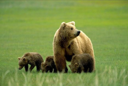

In [7]:
im = Image.open(dest)
im.to_thumb(128, 128)

In [8]:
bear_types = 'grizzly', 'black', 'teddy'
path = Path('bears')

In [9]:
if not path.exists():
  path.mkdir()

  for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_ddg(f'{o} bear')
    download_images(dest, urls=results)


In [10]:
fns = get_image_files(path)
fns

(#546) [Path('bears/teddy/d3444b72-fdee-4bb8-b986-9afa3ffa7451.jpeg'),Path('bears/teddy/d00b7450-c4ec-4541-b7f2-4e6c665f744e.jpg'),Path('bears/teddy/ed26dc7a-207e-49e7-b083-961749cc6b1d.png'),Path('bears/teddy/5f0f675d-8b66-48e0-bb52-6c7968aee77e.JPG'),Path('bears/teddy/90c1dccd-a0bd-4328-a4c5-49d5e5a6eec7.jpg'),Path('bears/teddy/5af07c6f-96f3-476b-9860-71c98ebe24da.jpg'),Path('bears/teddy/b3194349-f96d-4328-8c5e-af958c7a821a.jpg'),Path('bears/teddy/f7556410-69a1-4497-a6f9-fceefaa28322.jpg'),Path('bears/teddy/22bda9f6-e237-4403-a664-9e9a570e6f3d.jpg'),Path('bears/teddy/568e3944-50a7-4203-a353-01d4262d8921.jpg')...]

In [11]:
# Check for corrupted images
failed = verify_images(fns)
failed

(#27) [Path('bears/teddy/d00b7450-c4ec-4541-b7f2-4e6c665f744e.jpg'),Path('bears/teddy/703286be-8058-49e2-92e8-c3294f0912e6.jpg'),Path('bears/teddy/ae1508a6-c6da-47eb-a687-f444c9c04f3b.jpg'),Path('bears/teddy/7ec9b03f-1067-4802-9e26-389447c18820.jpg'),Path('bears/teddy/064a13f2-85c8-49ae-9954-bb947d909057.jpg'),Path('bears/teddy/a00a274f-a920-4143-b502-a463a5081a9e.jpg'),Path('bears/teddy/71757e81-c16a-4a5f-ace5-e5ddda753c26.jpg'),Path('bears/teddy/3edc430b-5ea6-46b2-ad16-450c66a1e712.jpg'),Path('bears/teddy/ecb64616-8f35-4a79-8379-8f09a800c7e4.jpg'),Path('bears/teddy/b7e3e7f3-ee51-4eaf-b72b-cf37dad0b148.jpg')...]

In [12]:
failed.map(Path.unlink)

(#27) [None,None,None,None,None,None,None,None,None,None...]

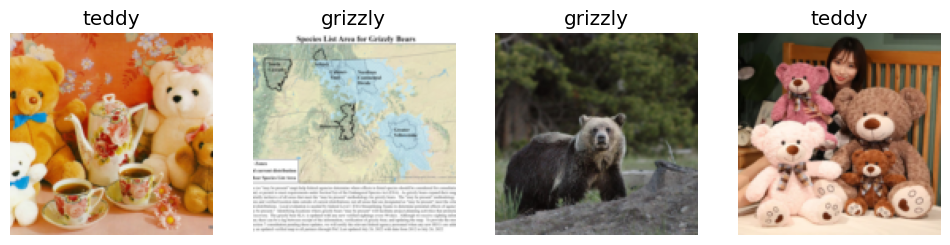

In [14]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

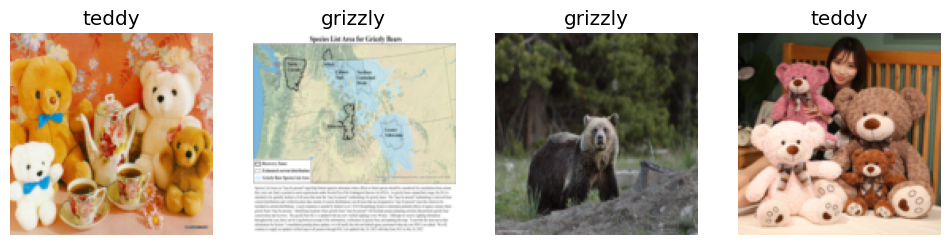

In [15]:
 bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
 dls = bears.dataloaders(path)
 dls.valid.show_batch(max_n=4, nrows=1)

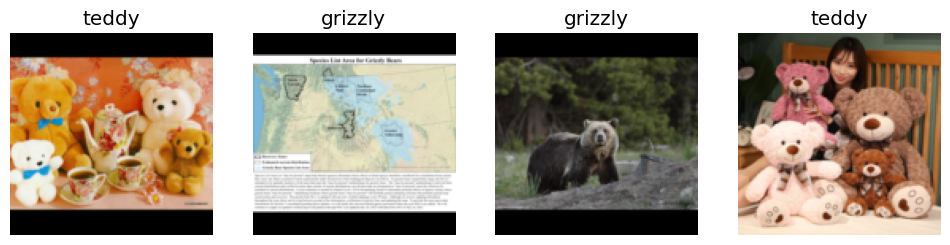

In [16]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

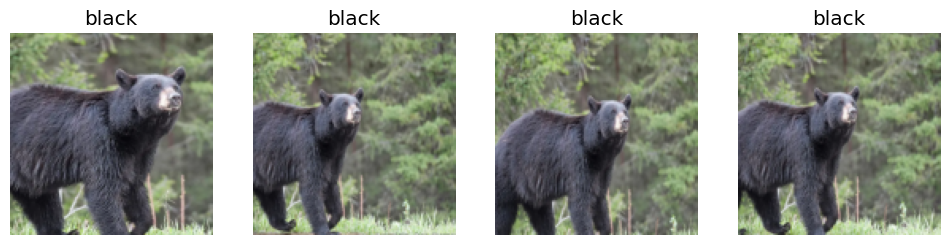

In [17]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

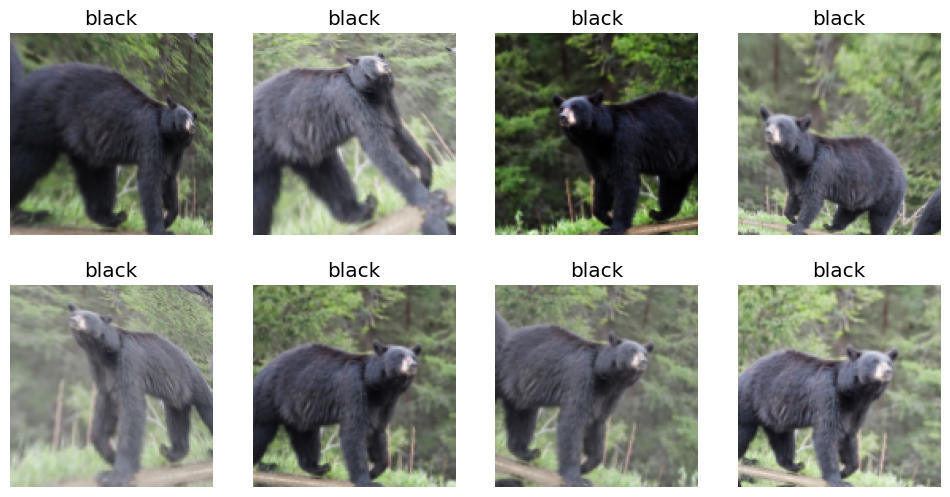

In [18]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

#### Training Your Model, and Using It to Clean Your Data

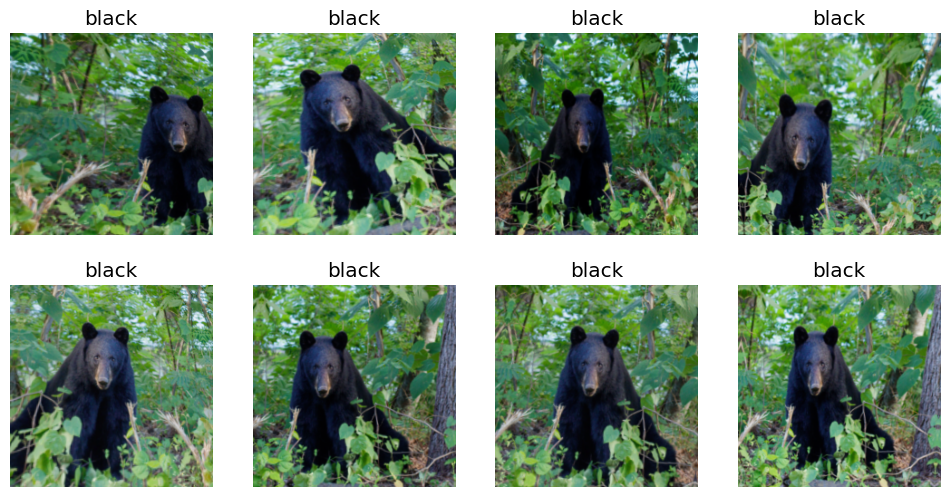

In [41]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [43]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.480954,0.158421,0.038835,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.294367,0.113397,0.029126,00:20
1,0.208668,0.058330,0.029126,00:22
2,0.180474,0.021731,0.019417,00:20
3,0.145923,0.022477,0.009709,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


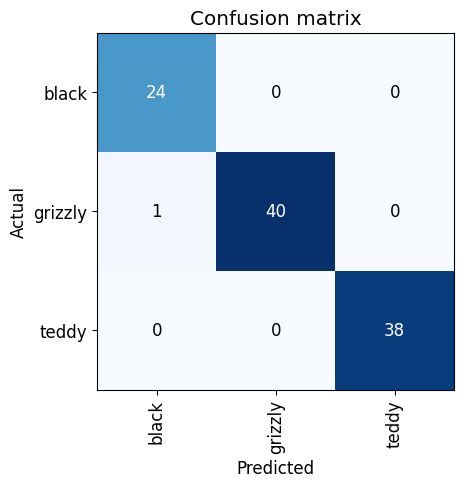

In [44]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

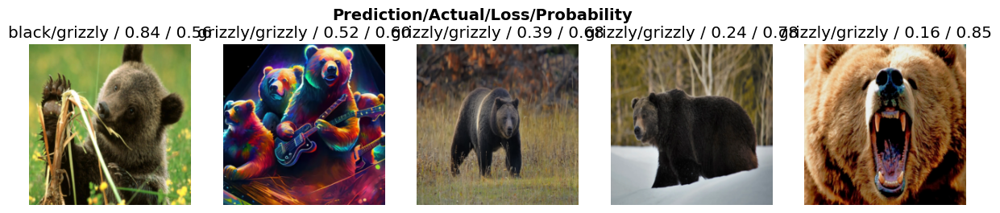

In [45]:
interp.plot_top_losses(5, nrows=1)

In [46]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [49]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

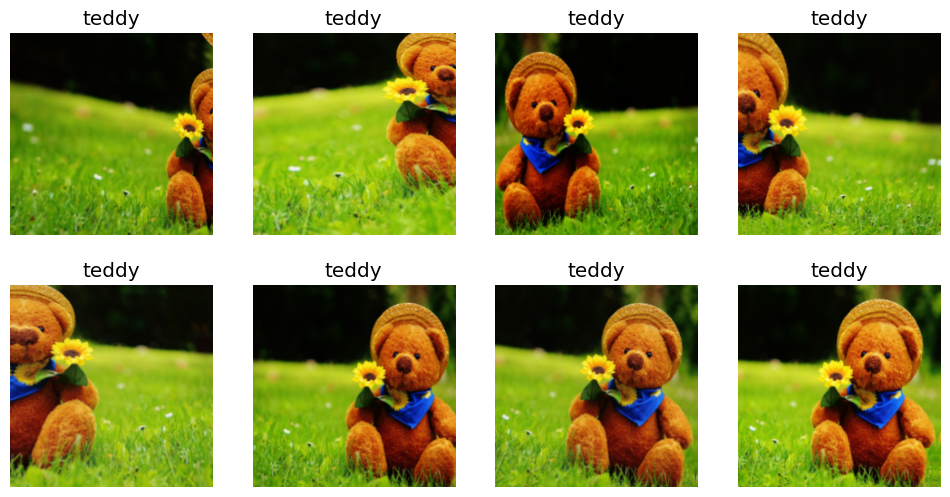

In [50]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [51]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.009418,0.190854,0.110000,00:21


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.243057,0.088044,0.040000,00:21
1,0.179416,0.133240,0.020000,00:20
2,0.132432,0.140759,0.030000,00:19
3,0.100473,0.114608,0.010000,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


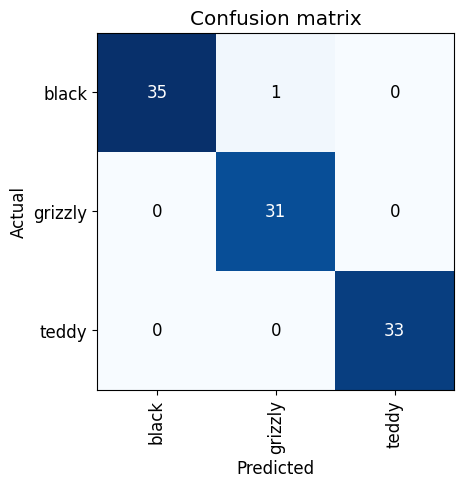

In [52]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

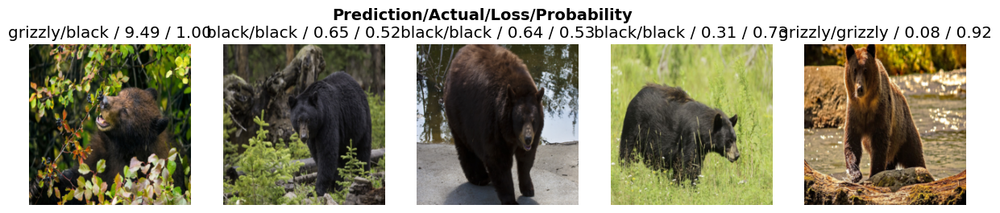

In [53]:
interp.plot_top_losses(5, nrows=1)

In [54]:
learn.export()